### 导入头文件

In [1]:
import sys
import os
import re
sys.path.append(os.getcwd())

import pandas as pd
import h5py as h5
import numpy as np
import utils
import math
from obspy.core import UTCDateTime as udt
import matplotlib.pyplot as plt
import fast_matched_filter as fmf
from time import time as give_time

### 读入所有模板事件

In [ ]:

result_dir = ''
path = './logs_EP/Xs20/'
file_name = 'matched_filter_results_threshold0.6_weight1.0_0.0_0.0.h5'
results = utils.load_result(file_name,path=path)

first_template = results['template_15390050.h5']
print(f"Template: {first_template}")
print("Matched count:", first_template['matched_count'])
print("Daily indices:", first_template['matched_event_index_daily'])
print("Global indices:",first_template['matched_event_index_all'])

# first_template = next(iter(results))
# print(f"Template: {first_template}")
# print("Matched count:", results[first_template]['matched_count'])
# print("Daily indices:", results[first_template]['matched_event_index_daily'])
# print("Global indices:", results[first_template]['matched_event_index_all'])

Template: {'matched_count': 2737, 'matched_event_index_daily': [[12414, 12417, 33567, 33570, 66072, 66075, 66078, 72615, 97629, 97632, 97635, 135188, 314536, 444354, 444357, 444360, 444366, 444369, 444372, 444375, 444378, 444381, 444384, 444387, 444390], [], [], [], [295650, 295653, 295656, 295659, 317280, 317283, 317286, 317289, 428399, 428402, 428405, 433926, 1429806, 1429809, 1460006, 1460009, 1460012, 1460015, 1460048, 1460051, 1460054, 1599651, 3383075, 3383078, 7635335, 7635338, 7635341, 7635344, 7635347, 7671580, 7671583, 7671586, 7672363, 7672366, 7942966, 7942969, 7942972, 7942975, 7942978, 7942981, 7942984, 7944701, 7944704, 8134044, 8447309, 8454501, 8454504, 8454507], [198999, 491600, 491603, 491606, 580400, 580403, 790720, 790723, 790726, 790729, 1241278, 1241281, 1241284, 6138784, 6138787, 6138790, 6138793, 6591337, 6591340, 6591343, 6850155, 7440975, 7534653, 7534656], [100462, 100465, 945748, 945751, 945754, 979218, 979221, 1282735, 1282738, 6049423, 6049426, 6049429, 6

### 读入整段地震事件

In [3]:
data = utils.load_data('LX.Xs28.h5')

### 模板匹配生成结果

In [ ]:
SR = 250    # sampling rate of the data
# fmf needs two extra arguments:
matched_filter_step = 1 # if set to 1, the sliding windows are taken every sample
architecture = 'gpu' # run fmf on GPUs (other option is 'cpu')
i = 0
for i,h5_file in enumerate(h5_files):
    # format the inputs for fmf by adding a new dimension
    # with 1 element (because this example only uses one template)
    template = utils.load_template(h5_file, path=event_dir)
    template_array = template['waveforms'][np.newaxis, :]
    moveouts = np.hstack( (template['moveouts_S'].reshape(-1, 1),
                        template['moveouts_S'].reshape(-1, 1),
                        template['moveouts_P'].reshape(-1, 1)) )
    moveout_array = moveouts[np.newaxis, :]
    # fmf requires a weight matrix used to compute the weighted correlation
    # coefficient sum
    weight_array = np.ones_like(moveout_array, dtype=np.float32)
    n_stations = weight_array.shape[1]
    n_components = weight_array.shape[2]
    # normalize so that the max value is 1 (optional)
    weight_array /= np.float32(n_stations * n_components)
    
    cc_sum = fmf.matched_filter(template_array,
                                moveout_array,
                                weight_array,
                                data['waveforms'],
                                matched_filter_step,
                                arch=architecture)
    # save the output
    with h5.File('./output/event/ccsum/cc_sum'+'_'+h5_file, mode='w') as f:
        f.create_dataset('cc_sum', data=cc_sum, compression='gzip')
    figsize = (30, 10)
    plt.figure('cc_sum', figsize=figsize)
    time = np.linspace(0., float(cc_sum.shape[1]) / data['metadata']['sampling_rate'], cc_sum.shape[1])
    #smart_plot = np.abs(cc_sum[0,:]) > 2.5 * np.std(cc_sum[0,:])
    #print(smart_plot.shape)
    #plt.plot(time[smart_plot], cc_sum[0, smart_plot], lw=0.5)
    plt.plot(time, cc_sum[0], lw=0.5)
    plt.axhline(1, lw=2, ls='--', color='k')
    plt.xlabel('Time (s)')
    plt.ylabel('Average correlation coefficient')
    plt.title(h5_file+'_ccsum:')
    #plt.title(h5_file+'_ccsum:'+str(lowcut)+'-'+str(highcut)+'Hz')
    plt.xlim(time.min(), time.max())
    #plt.ylim(-0.2,0.2)
    plt.savefig('./output/cc_img_1_10/'+h5_file+'.png')
    plt.close()

### 分析cc_sum内容

In [6]:
# 定义 output/event 目录的路径
data = utils.load_data('LX.Xs28.h5')
ccsum_dir = './output/event/ccsum/'
# 使用正则表达式提取数字部分，并将其转换为整数
def extract_number(filename):
    match = re.search(r'\d+', filename)
    if match:
        return int(match.group())
    return 0

# 获取目录下所有 .h5 文件
h5_files = [f for f in os.listdir(ccsum_dir) if f.endswith('.h5')]
h5_files = sorted(h5_files,key=extract_number)

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
from matplotlib.lines import Line2D
def extract_plot_point(data,h5_files,path,cut_point=0.5):
    # load the template event that we have just built
    plot_template_points = np.zeros((len(h5_files), data['waveforms'][0].shape[1]),dtype=bool)
    for i,h5_file in enumerate(h5_files):
        cc_sum = utils.load_template(h5_file, path=path)['cc_sum']
        #smart_plot = np.abs(cc_sum) > 2.5 * np.std(cc_sum)
        plot_point = np.abs(cc_sum[0,:]) > cut_point
        plot_point = np.pad(plot_point, (0, plot_template_points.shape[1] - plot_point.shape[0]), 'constant', constant_values=(False,))
        #plot_points = np.bitwise_or(plot_points, plot_point)
        plot_template_points[i,:] = plot_point
    return plot_template_points

def plot_single_template_covered_event(data, h5_file, path,cut_point=0.7):
    # plot the cc time series
    plot_template_points = extract_plot_point(data,h5_file,path,cut_point)
    figsize = (50, 30)
    plt.figure('cc_sum', figsize=figsize)
    time = np.linspace(0., float(data['waveforms'][0].shape[1]) / data['metadata']['sampling_rate'], data['waveforms'][0].shape[1])
    plt.plot(time, data['waveforms'][0][0], lw=0.5)
    plt.title("Covered event")
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')

    for t in time[plot_template_points[0]]:
        plt.axvline(x=t,color='r', linestyle='--', lw=0.5)
        
    start_time = time[68000*250]
    end_time = time[78000*250]
    plt.xlim(start_time, end_time)
    plt.show()
    plt.savefig(os.path.join(ccsum_dir+"images/top8",h5_file.split('/')[-1].split('.')[0]+'.png'))
    return plot_template_points

def plot_covered_event(data, plot_template_points, h5_files):
    # plot the cc time series
    figsize = (200, 30)
    plt.figure('cc_sum', figsize=figsize)
    time = np.linspace(0., float(data['waveforms'][0].shape[1]) / data['metadata']['sampling_rate'], data['waveforms'][0].shape[1])
    plt.plot(time, data['waveforms'][0][0], lw=0.5)
    plt.title("Covered event")
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')

    legend_labels = []
    # 使用 colormap 来生成更多的颜色
    cmap = cm.get_cmap('tab20', len(h5_files))  # 'tab20' 包含 20 种颜色
    line_proxies = []  # 用于存储代理对象

    for i, h5_file in enumerate(h5_files):
        for t in time[plot_template_points[i, :]]:
            plt.axvline(x=t, color=cmap(i), linestyle='--', lw=0.5)
        legend_labels.append(h5_file.split('/')[-1].split('.')[0])
        # 创建代理对象
        line_proxies.append(Line2D([0], [0], color=cmap(i), linestyle='--', lw=0.5))
        
    #start_time = time[60000*250]
    #end_time = time[75000*250]
    start_time = time[0]
    end_time = time[-1]
    plt.legend(line_proxies, legend_labels, loc="best")
    plt.xlim(start_time, end_time)
    plt.show()


In [8]:
h5_files

['cc_sum_template_15021000.h5',
 'cc_sum_template_15029300.h5',
 'cc_sum_template_15059524.h5',
 'cc_sum_template_15059524_l.h5',
 'cc_sum_template_15059524_h.h5',
 'cc_sum_template_15355949_h.h5',
 'cc_sum_template_15355949.h5',
 'cc_sum_template_15355949_l.h5',
 'cc_sum_template_15390050_l.h5',
 'cc_sum_template_15390050_h.h5',
 'cc_sum_template_15390050.h5',
 'cc_sum_template_15625774.h5',
 'cc_sum_template_15643044.h5',
 'cc_sum_template_15754899.h5',
 'cc_sum_template_15992000.h5',
 'cc_sum_template_16181250.h5',
 'cc_sum_template_16206050.h5',
 'cc_sum_template_16229300.h5',
 'cc_sum_template_16232750.h5',
 'cc_sum_template_16240899.h5',
 'cc_sum_template_16254100.h5',
 'cc_sum_template_16254949.h5',
 'cc_sum_template_16256699.h5',
 'cc_sum_template_16260300.h5',
 'cc_sum_template_16334625.h5',
 'cc_sum_template_16334774.h5',
 'cc_sum_template_16931250.h5',
 'cc_sum_template_17179824.h5',
 'cc_sum_template_18725449.h5']

In [14]:
top_indices = [15,  8,  9, 16, 17, 26, 27, 12, 13]
h5_files = [h5_files[i] for i in top_indices]
for h5_file in h5_files:
    single_template_plot_points = plot_single_template_covered_event(data=data,h5_file=h5_file,path=ccsum_dir,cut_point=0.7)

IndexError: list index out of range

In [41]:
true_indices = np.where(single_template_plot_points==True)[1]/250
true_indices

array([ 64244.728,  64886.884,  65223.296,  67345.144,  67441.392,
        68783.928,  70582.504,  71311.22 ,  71602.304,  72094.16 ,
        72397.828,  72521.232,  72825.5  ,  74545.212,  74733.96 ,
        74901.796,  75646.864,  75804.884,  75942.34 ,  75996.564,
        76098.744,  76156.876,  76220.004,  76290.148,  76353.216,
        76530.288,  76651.4  ,  76712.496,  81994.996])

In [40]:
len(true_indices)

29

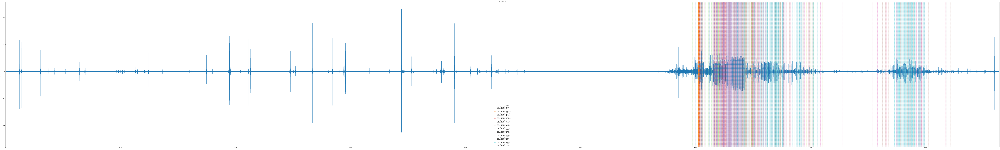

In [9]:
plot_template_points = extract_plot_point(data,h5_files,ccsum_dir,cut_point=0.7)
plot_covered_event(data,plot_template_points,h5_files)

In [22]:
plot_template_points

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ..., 
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]], dtype=bool)

In [11]:
true_indices = np.where(plot_template_points==True)
len(true_indices[1])

3160

In [20]:
true_indices[1]/250

array([ 59917.664,  59994.348,  60084.   , ...,  76651.4  ,  76712.496,
        81994.996])

In [55]:
dt1 = np.sort(true_indices[1]/250)
dt2 = np.sort(true_indices[1]/250)

dt = [dt2[i+1] - dt1[i] for i in range(len(dt1)-1)]

In [56]:
dt

[135.10800000000017,
 0.0080000000016298145,
 233.1160000000018,
 0.0080000000016298145,
 163.46399999999994,
 20.767999999996391,
 43.520000000004075,
 36.327999999994063,
 0.0080000000016298145,
 52.184000000001106,
 30.128000000004249,
 77.539999999993597,
 12.648000000001048,
 28.247999999999593,
 10.304000000003725,
 17.139999999999418,
 8.3439999999973224,
 16.599999999998545,
 9.9040000000022701,
 24.60399999999936,
 34.952000000004773,
 3.591999999996915,
 33.192000000002736,
 0.0079999999943538569,
 0.0080000000016298145,
 47.696000000003551,
 23.220000000001164,
 0.0079999999943538569,
 11.108000000000175,
 30.20400000000518,
 0.0,
 4.1239999999961583,
 0.0,
 4.5279999999984284,
 0.0,
 0.48800000000483124,
 0.011999999995168764,
 0.012000000002444722,
 3.6279999999969732,
 0.0,
 7.7479999999995925,
 0.76800000000366708,
 0.0,
 5.4279999999998836,
 6.2839999999996508,
 0.0,
 3.5800000000017462,
 0.0,
 3.5879999999961001,
 0.0,
 3.5280000000057044,
 0.0,
 7.4519999999974971,
 0

In [57]:
dt = np.array(dt)

In [58]:
dt=dt[dt<5]
len(dt)

2192

(0, 1)

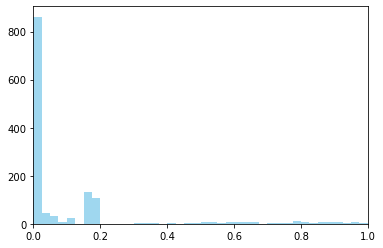

In [64]:
import matplotlib.pyplot as plt
plt.hist(dt, bins=200, color='skyblue', alpha=0.8)
plt.xlim([0,1])

In [21]:
true_indices = np.where(plot_template_points==True)
len(true_indices[1])

3160

In [20]:
true_counts = np.sum(plot_template_points, axis=1)
print(true_counts)

[ 15  36  22   4  33  10   1   4 113 122  21  45 384 643  44 103 187 237
  17  69  47  85  29  13  35  78 362 372  29]


In [53]:
top_indices = np.argsort(true_counts)[-9:]
top_indices

array([15,  8,  9, 16, 17, 26, 27, 12, 13])

In [37]:
h5_file_select = [h5_files[i] for i in top_indices]

In [1]:
plot_template_points = extract_plot_point(data,h5_file_select,ccsum_dir,cut_point=0.7)
plot_covered_event(data,plot_template_points,h5_file_select)

NameError: name 'extract_plot_point' is not defined

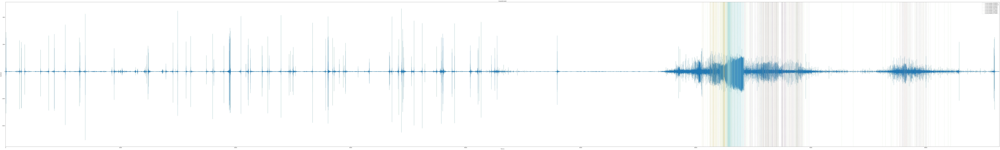

In [59]:
plot_template_points = extract_plot_point(data,h5_file_select,ccsum_dir,cut_point=0.8)
plot_covered_event(data,plot_template_points,h5_file_select)

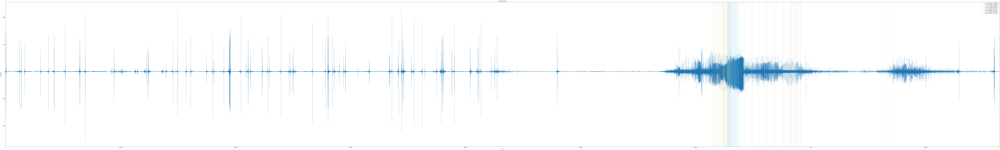

In [60]:
plot_template_points = extract_plot_point(data,h5_file_select,ccsum_dir,cut_point=0.9)
plot_covered_event(data,plot_template_points,h5_file_select)

In [62]:
true_indices = np.where(plot_template_points==True)
len(true_indices[1])

193

In [10]:
plot_template_points

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ..., 
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]], dtype=bool)